In [1]:
import torch
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy import stats, ndimage

import sys
from pathlib import Path

root = Path().resolve()

sys.path.insert(0, str(root / 'code'))

from sde_routines_condi import *
from utils import *
from check_moments import *

from ortho_wavelet import *

sys.path.insert(0, str(root  / 'data'))
from data_loader import *
from data_generator import *

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Get the data

In [2]:
def split_periodize_reshape(Data, n1):
    """
    Splits Data into non-overlapping subseries of length n1 along the last axis,
    discards the end if not divisible, periodizes each subseries, and reshapes
    the output to [batch * num_subseries, channels, n1].

    Args:
        Data: torch.Tensor, shape [batch, channels, time]
        n1: int, length of each subseries

    Returns:
        torch.Tensor, shape [batch * num_subseries, channels, n1]
    """
    num_subseries = Data.size(-1) // n1
    Data_sub = Data[:, :, :num_subseries * n1]  # Discard the end
    Data_sub = Data_sub.unfold(-1, n1, n1)  # Shape: [batch, channels, num_subseries, n1]

    # Periodize
    first = Data_sub[..., 0:1]
    last = Data_sub[..., -1:]
    a = (last - first) / (n1 - 1)
    b = first
    x = torch.arange(n1, device=Data.device, dtype=Data.dtype)
    linear = a * x + b
    Data_periodized = Data_sub - linear


    # Reshape
    batch, channels, _, _ = Data_periodized.shape
    return Data_periodized.reshape(batch * num_subseries, channels, n1)

In [3]:
#Orthogonal Wavelet
W =   DefineWavelet('Db',m=4,device=device)

In [4]:
Data = load_turbulence_1d()
n1 = 1024  # desired subseries length
Data = split_periodize_reshape(Data, n1)
for j in range(1):
    Data =W.decompose(Data)[1]#(W.decompose(Data)[1])[1]#Data[:,:,::2]+Data[:,:,1::2]
x1 = normalize(Data[:500]).to(device)
print(x1.shape)

torch.Size([500, 1, 512])


In [6]:
torch.save(x1,str(root)+'/data_512.pt')

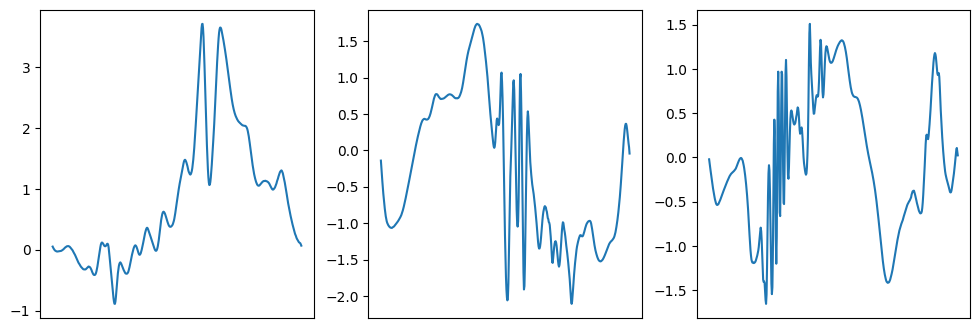

In [5]:
plot_time_series_row(x1, 3)

In [6]:
#load_data
config_load = 'turbulence_changed_pots_condisigma1_256_J_6_Q_3_sigma_1'
x_k_condi = load_results( root, config_load)[0].to(device)[:500]

std =W.decompose(x1)[1].std()
x_k_condi = x_k_condi*std

print(x_k_condi.shape)

torch.Size([500, 1, 256])


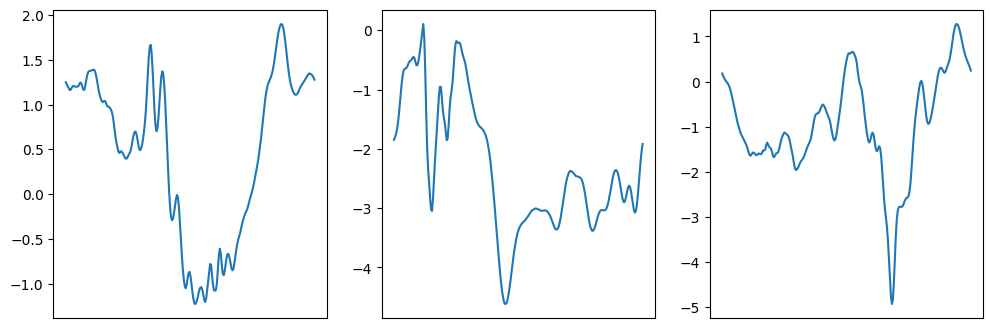

In [7]:
plot_time_series_row(x_k_condi, 3)

### Choose the model

In [7]:
n1, channels, M = x1.shape
print(f'(B, C, T) = ({n1}, {channels}, {M}).')

J = 6
Q = 3

# choose terms in the model
terms = ['Scalar_psi_quantile_confine','Scattering_Second_Order_Real','Scattering_Fourth_Order_Real','L_4','L_6','L_8']#,'L10']#
#Filters
filters = return_Filters(M, J, 1, device=device)
filters_Q = return_Filters(M, J, Q, device=device)

scalar_param={}
scalar_param['stride_sigmas'] = 0.2 
scalar_param['num_centers'] = 8
scalar_param['margin'] = -0.1

(B, C, T) = (500, 1, 512).


In [8]:
potentials = get_1d_potentials_condi(W,terms, J, filters,Q=Q,filters_Q=filters_Q,scalar_param=scalar_param, parallel=False)

## Solve the SDE

In [9]:
# SDE parameters
interpolant = 'Cos'
nt          = 80000#100000
t           = 1-(1-torch.linspace(0, 1, nt + 1))**2
sigma       = 0.02#1

nb_workers      = x1.shape[0] # number of particles
nb_interpolants = x1.shape[0] # number of I_t (not necessarily the dataset size, since several noise paths could be considered per data sample)

batch_size = x1.shape[0]#//2

regularization = 1e-1

Solver = SDE_condi(W,x1, nb_workers, nb_interpolants, t, sigma, potentials, batch_size, device=device, regularization=regularization, interpolant=interpolant
                   ,x_k_condi =x_k_condi)

Signal detected as 1D: (B, C, T) = (500, 1, 256).
The model has 197 potentials.


In [10]:
config = 'turbulence_changed_pots_condisigma1_'+str(M)+'_J_'+str(J)+'_Q_'+str(Q)+'_sigma_'+str(sigma)

In [14]:
print(config)

turbulence_changed_pots_condisigma1_512_J_6_Q_3_sigma_0.02


In [ ]:
xt, barphi_e, barphi_p, eta_t, theta_t, dH_t_bound = Solver()

36it [00:07,  4.59it/s]

In [ ]:
save_results(xt, theta_t, dH_t_bound, t, root, config)

In [ ]:
# Check (non negligible) moments matching

threshold = 1e-8 # threshold above which should be considered

plot_moment_matching(barphi_e, barphi_p, t, threshold)

In [11]:
xt, theta_t, dH_t_bound, t =load_results( root, config)

In [12]:
x1_high,x1_low = W.decompose(x1[::10].to(device))
xt_high,xt_low = W.decompose(xt[::10].to(device))
Solver.fit(x1_high[::10],x1_low[::10])
m1,mt = Solver.compute_moments(x1_high[::10],x1_low[::10]).mean(0),Solver.compute_moments(xt_high[::10],xt_low[::10]).mean(0)

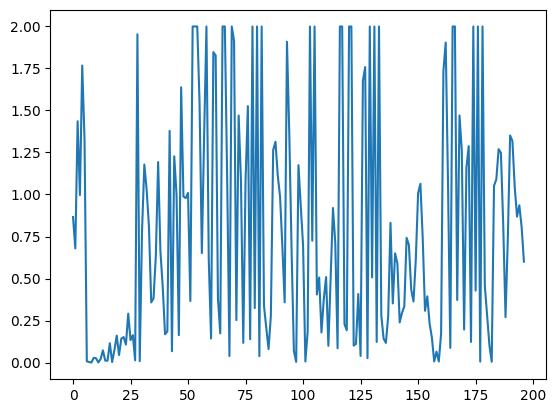

In [13]:
plt.plot((2*(m1-mt).abs()/(m1.abs()+mt.abs())).cpu())

## Analyze the result

Looking at the samples and moment matching along the dynamics:

In [14]:
def plot_time_series_row(Data, N):
    random_indexes = np.arange(N)

    fig, axs = plt.subplots(1, N, figsize=(4*N, 4))
    for i in range(N):
        idx = random_indexes[i]
        axs[i].get_xaxis().set_visible(False)
        axs[i].plot(Data[idx,0].cpu())
    plt.show()

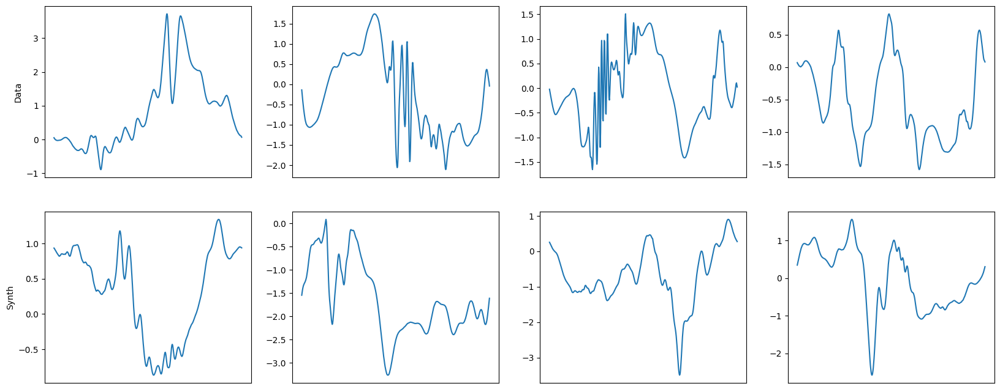

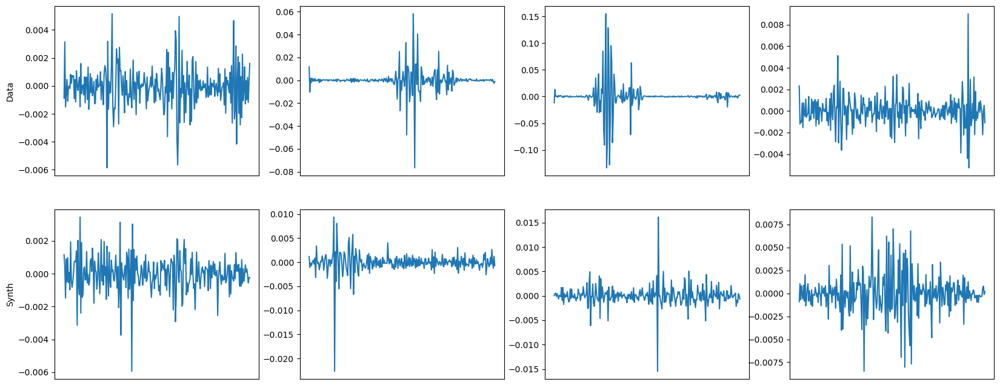

In [15]:
# Visual Check
Compare_time_series_row(x1,xt, 4)
# Visual High_freq
Compare_time_series_row(W.decompose(x1)[0],W.decompose(xt)[0], 4)

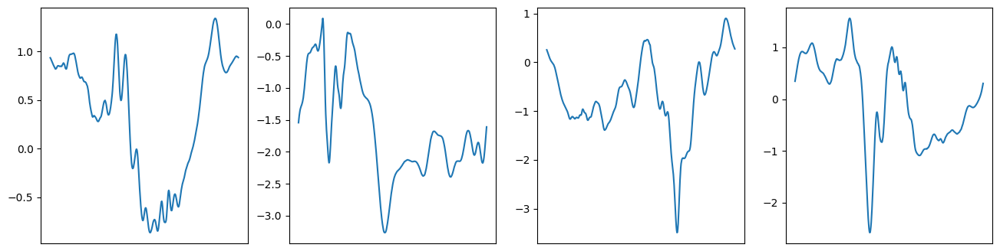

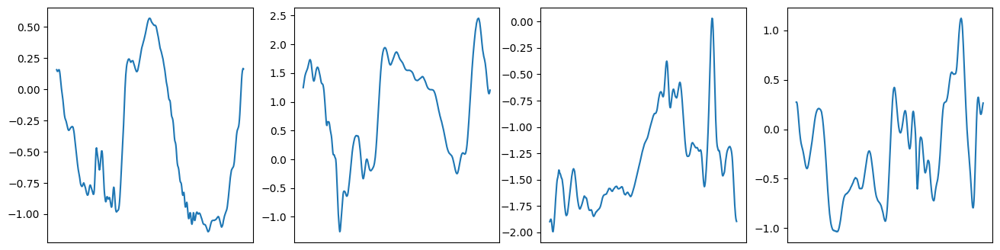

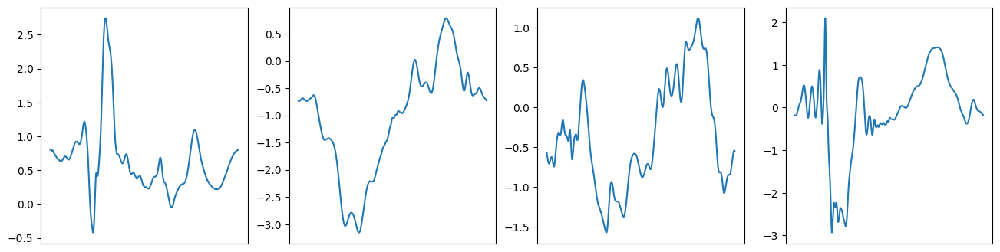

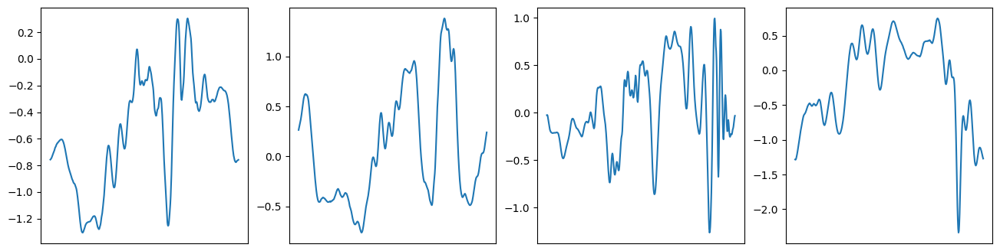

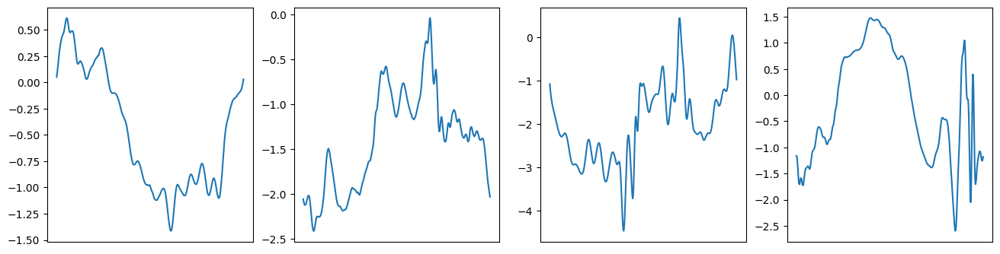

...

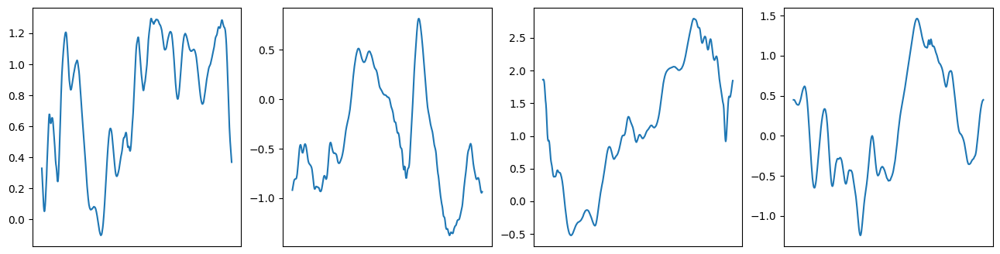

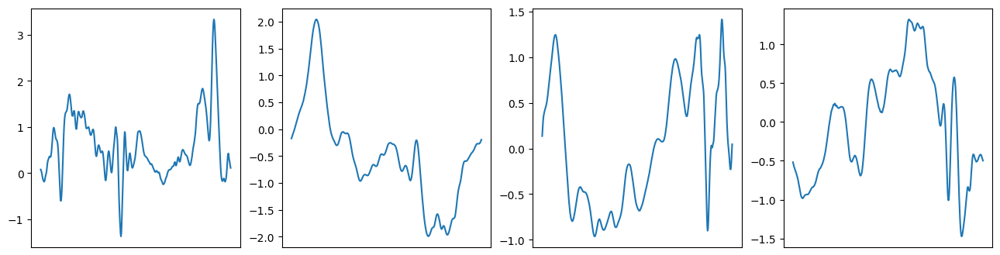

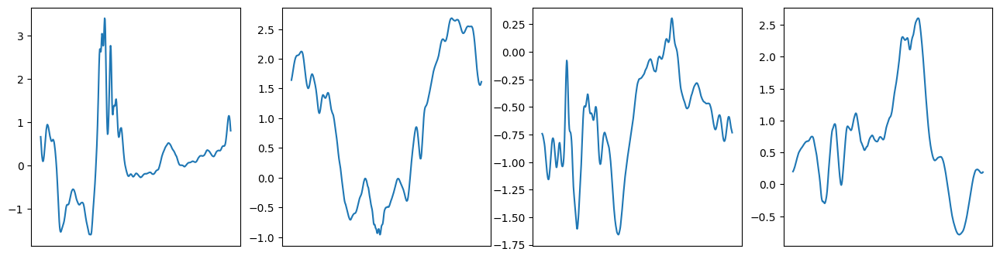

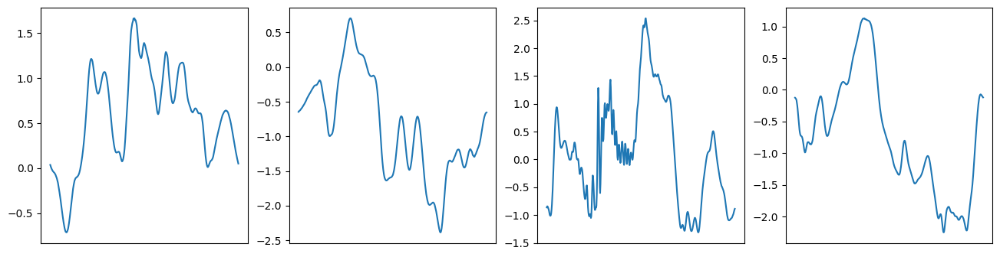

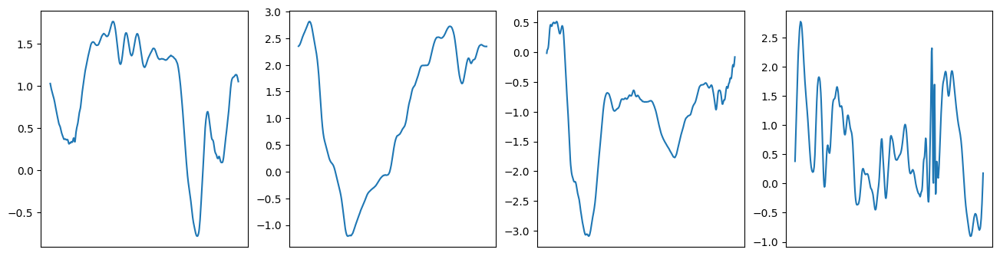

In [16]:
#Synthesis
for i in range(100):
    plot_time_series_row(xt[i*4:(i+1)*4], 4)
   


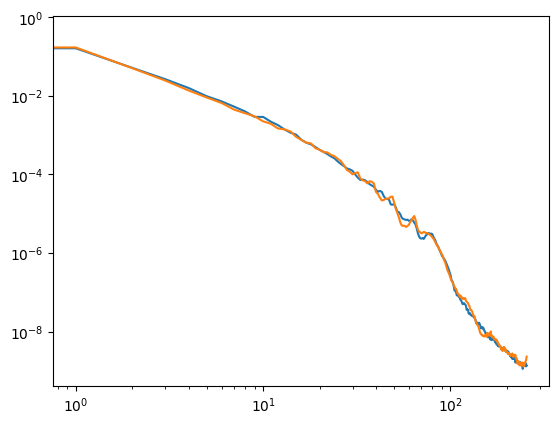

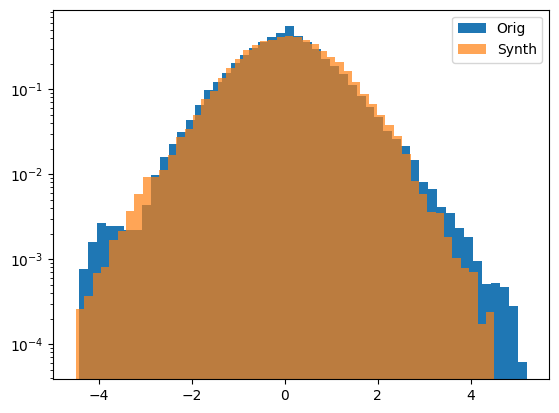

In [17]:
# Check Statistical Properties
spec_plot(x1,xt)

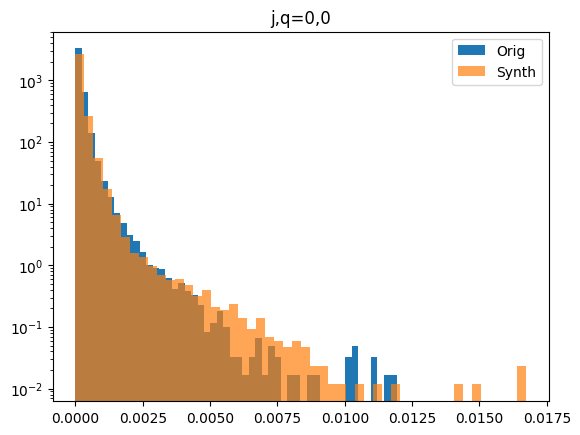

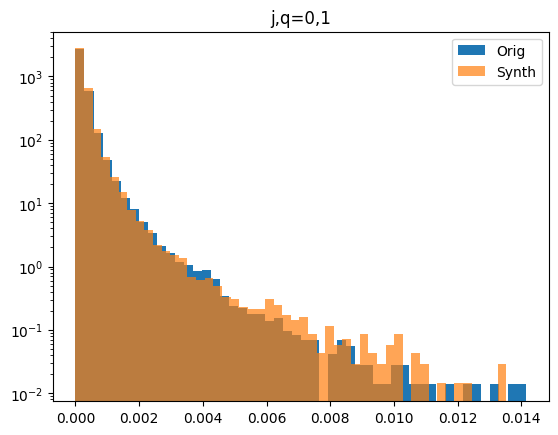

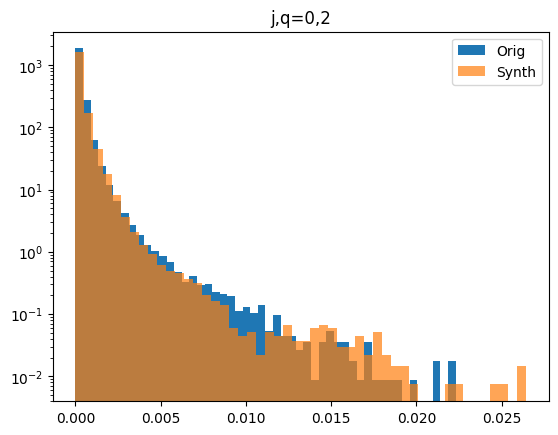

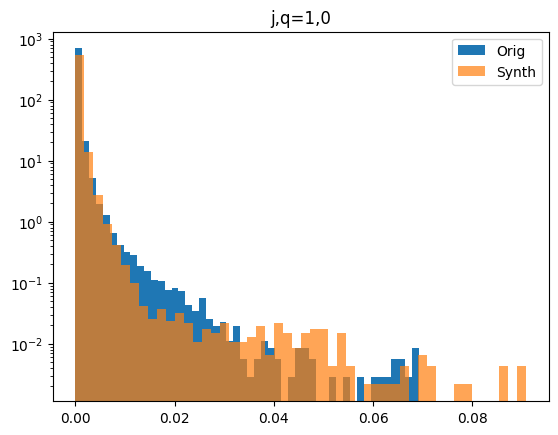

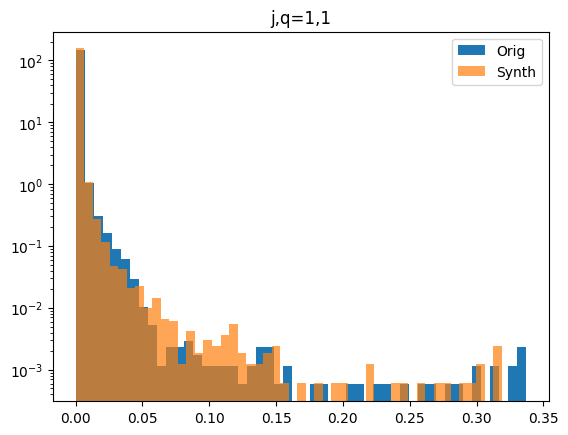

...

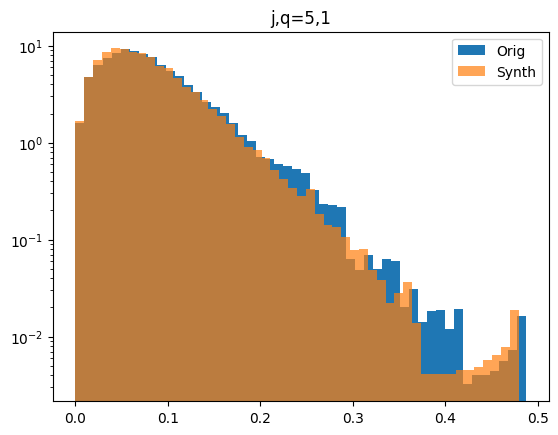

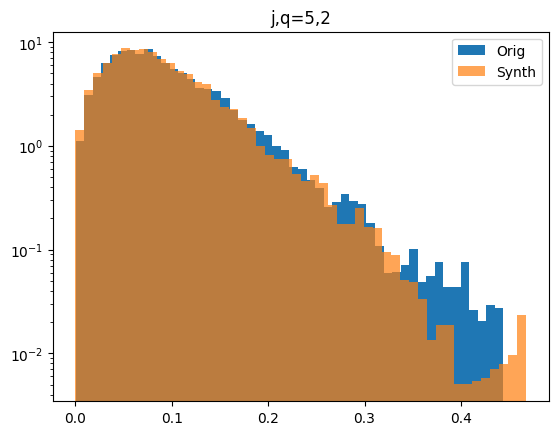

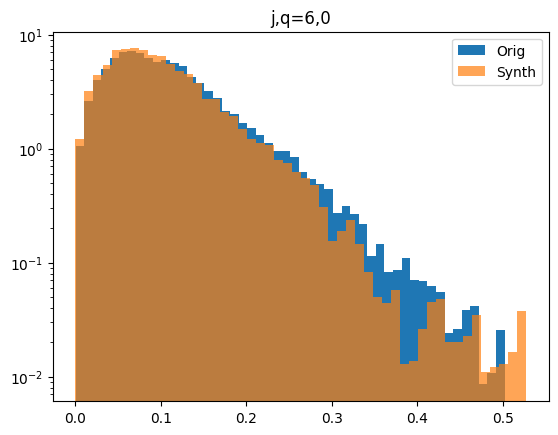

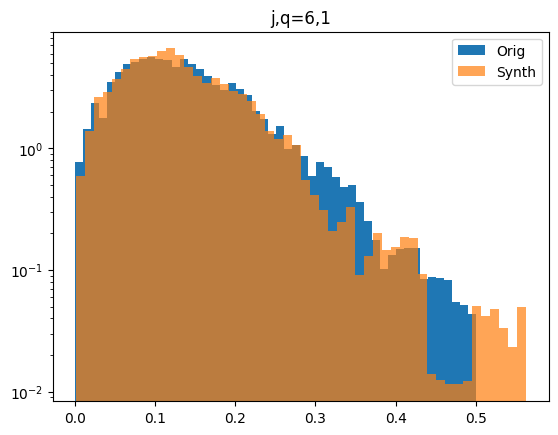

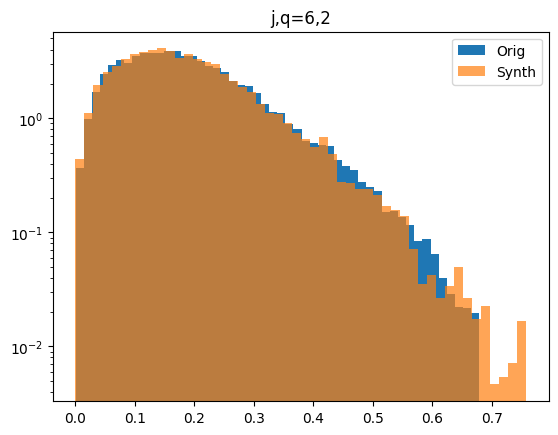

In [18]:
hist_plot(x1,xt)

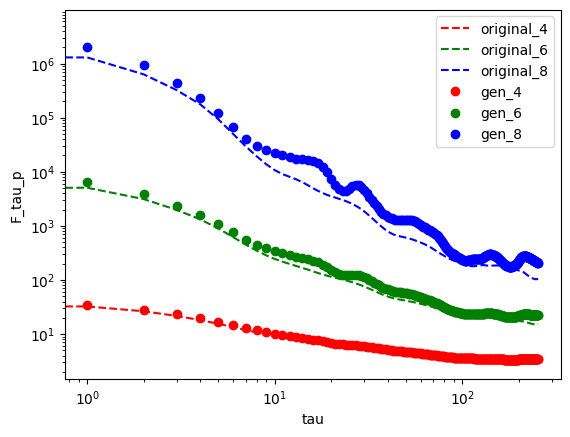

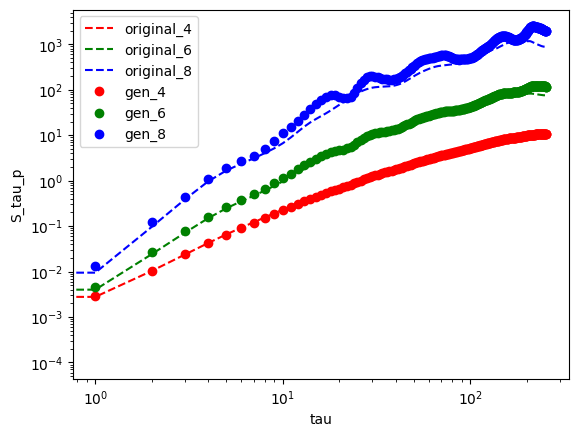

In [19]:
structure_plot(x1,xt)

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
from scipy.ndimage import gaussian_filter1d
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

C_ORIG  = 'tab:blue'   # original
C_SYNTH = 'tab:red'    # synthesis


def _shade(color, frac):
    """Lighten `color` slightly toward white for small frac; never dark.
    frac in [0,1]: 0 -> a little lighter, 1 -> base color."""
    r, g, b = to_rgb(color)
    t = 0.30 * (1.0 - frac)          # gentle: max 0.30 toward white
    return (r + (1 - r) * t,
            g + (1 - g) * t,
            b + (1 - b) * t)


def visual_comparison(Data, synth,
                      pdf_taus=(1, 2, 4, 8, 16, 32),
                      sf_orders=(4, 6, 8),
                      c4_fixed_tau=10,
                      n_bins=201, smooth=True, smooth_sigma=1.5,
                      pdf_xlim=(-8, 8), a_ylim=None, epsilon=1e-8):
    """
    Statistical comparison: original (blue) vs synthesis (red).
    Layout: 2x2 block on the left (a, b, d, e), tall panel (c) on the right.
    """
    data_np  = Data.cpu().numpy()
    synth_np = synth.cpu().numpy()
    max_tau  = Data.shape[-1] // 2

    plt.rcParams.update({
        'font.size': 20,
        'font.weight': 'normal',
        'axes.labelweight': 'normal',
        'axes.titleweight': 'normal',
        'axes.linewidth': 1.4,
    })
    LW    = 5.0
    LW_A  = 4.0
    LABEL_FS = 22

    taus_arr = np.arange(1, max_tau)

    def abs_increments_pow_mean(x, tau, p):
        d = np.abs(x[..., tau:] - x[..., :-tau])
        return np.mean(np.power(d.reshape(-1), p))

    fig = plt.figure(figsize=(20, 12))
    gs  = fig.add_gridspec(2, 3)
    axA = fig.add_subplot(gs[0, 0])
    axB = fig.add_subplot(gs[0, 1])
    axD = fig.add_subplot(gs[1, 0])
    axE = fig.add_subplot(gs[1, 1])
    axC = fig.add_subplot(gs[:, 2])

    # ----- (a) marginal distribution -----
    s_orig  = data_np.reshape(-1)
    s_synth = synth_np.reshape(-1)
    lo = min(s_orig.min(), s_synth.min())
    hi = max(s_orig.max(), s_synth.max())
    bins = np.linspace(lo, hi, n_bins)
    ctr  = 0.5 * (bins[1:] + bins[:-1])
    p_o, _ = np.histogram(s_orig,  bins=bins, density=True)
    p_s, _ = np.histogram(s_synth, bins=bins, density=True)
    if smooth:
        p_o = gaussian_filter1d(p_o, smooth_sigma)
        p_s = gaussian_filter1d(p_s, smooth_sigma)
    p_o = np.where(p_o > 0, p_o, np.nan)
    p_s = np.where(p_s > 0, p_s, np.nan)
    axA.plot(ctr, p_o, color=C_ORIG,  lw=LW_A, label='Original')
    axA.plot(ctr, p_s, color=C_SYNTH, lw=LW_A, label='Synthesis')
    axA.set_yscale('log')
    axA.set_ylabel('PDF')
    if a_ylim is not None:
        axA.set_ylim(a_ylim)
    axA.legend(frameon=False, fontsize=16)
    axA.grid(True, ls=':', alpha=0.5)

    # ----- (b) power spectrum -----
    def psd(x):
        x2 = x.reshape(-1, x.shape[-1])
        f  = np.fft.rfft(x2, axis=-1)
        return np.mean(np.abs(f) ** 2, axis=0)
    P_o = psd(data_np)
    P_s = psd(synth_np)
    omega = np.fft.rfftfreq(data_np.shape[-1])
    axB.plot(omega[1:], P_o[1:], color=C_ORIG,  lw=LW)
    axB.plot(omega[1:], P_s[1:], color=C_SYNTH, lw=LW)
    axB.set_xscale('log')
    axB.set_yscale('log')
    #axB.set_xlabel(r'$\omega$')
    axB.set_ylabel('Power Spectrum')
    axB.grid(True, which='both', ls=':', alpha=0.5)

    # ----- (d) structure functions SF_k -----
    sf_colors = {4: 'tab:red', 6: 'tab:green', 8: 'tab:blue'}
    for p in sf_orders:
        SF_o = np.array([abs_increments_pow_mean(data_np,  t, p) for t in taus_arr])
        SF_s = np.array([abs_increments_pow_mean(synth_np, t, p) for t in taus_arr])
        col = sf_colors.get(p, 'k')
        axD.plot(taus_arr, SF_o + epsilon, '--', color=col, lw=LW)
        axD.plot(taus_arr, SF_s + epsilon, '-',  color=col, lw=LW,
                 label=rf'$\mathrm{{SF}}_{{{p}}}$')
    axD.set_xscale('log')
    axD.set_yscale('log')
    axD.set_xlabel(r'$\tau$')
    axD.set_ylabel(r'$\mathrm{SF}_k(\tau)$')
    axD.legend(frameon=False, fontsize=16)
    axD.grid(True, which='both', ls=':', alpha=0.5)

    # ----- (e) C_4 coefficient -----
    if not (1 <= c4_fixed_tau < max_tau):
        raise ValueError(f"c4_fixed_tau={c4_fixed_tau} must be in [1, {max_tau-1}]")

    def s22_over_s4(x, t_star):
        ratio = np.zeros(len(taus_arr))
        for i, t in enumerate(taus_arr):
            L = min(x.shape[-1] - t_star, x.shape[-1] - t)
            du_star = np.abs(x[..., t_star:t_star + L] - x[..., :L])
            du_t    = np.abs(x[..., t:t + L]           - x[..., :L])
            s22 = np.mean((du_star ** 2 * du_t ** 2).reshape(-1))
            s4  = np.mean((du_t ** 4).reshape(-1))
            ratio[i] = s22 / (s4 + epsilon)
        return ratio
    r_o = s22_over_s4(data_np,  c4_fixed_tau)
    r_s = s22_over_s4(synth_np, c4_fixed_tau)
    axE.plot(taus_arr, r_o, 'o-', color=C_ORIG,  lw=LW, ms=5)
    axE.plot(taus_arr, r_s, 's-', color=C_SYNTH, lw=LW, ms=5)
    axE.set_xscale('log')
    axE.set_xlabel(r'$\tau$')
    axE.set_ylabel(r'$C_4(\tau,\tau^\star)$')
    axE.grid(True, ls=':', alpha=0.5)

    # --- inset zooming near tau* ---
    tau_lo = 3#max(1, int(c4_fixed_tau / 2))
    tau_hi = 50#min(taus_arr[-1], int(c4_fixed_tau * 2))
    mask = (taus_arr >= tau_lo) & (taus_arr <= tau_hi)
    y_local = np.concatenate([r_o[mask], r_s[mask]])
    y_lo, y_hi = y_local.min(), y_local.max()
    pad = 0.1 * (y_hi - y_lo + 1e-12)

    axins = inset_axes(axE, width='45%', height='45%', loc='upper right',
                       borderpad=1.5)
    axins.plot(taus_arr, r_o, 'o-', color=C_ORIG,  lw=LW * 0.6, ms=4)
    axins.plot(taus_arr, r_s, 's-', color=C_SYNTH, lw=LW * 0.6, ms=4)
    axins.set_xscale('log')
    axins.set_xlim(tau_lo, tau_hi)
    axins.set_ylim(y_lo - pad, y_hi + pad)
    axins.axvline(c4_fixed_tau, color='k', ls=':', lw=1.5)  # mark tau*
    axins.tick_params(labelsize=11)
    axins.grid(True, ls=':', alpha=0.5)
    mark_inset(axE, axins, loc1=2, loc2=4, fc='none', ec='0.5', lw=1.0)

    # ----- (c) increment PDFs (waterfall), gentle gradient -----
    taus = list(pdf_taus)
    n = len(taus)
    for k, tau in enumerate(taus):
        frac = k / max(n - 1, 1)
        col_o = _shade(C_ORIG,  frac)
        col_s = _shade(C_SYNTH, frac)

        d_o = (data_np[...,  tau:] - data_np[...,  :-tau]).reshape(-1)
        d_s = (synth_np[..., tau:] - synth_np[..., :-tau]).reshape(-1)
        d_o = d_o / (d_o.std() + 1e-12)
        d_s = d_s / (d_s.std() + 1e-12)
        b   = np.linspace(pdf_xlim[0], pdf_xlim[1], n_bins)
        c   = 0.5 * (b[1:] + b[:-1])
        h_o, _ = np.histogram(d_o, bins=b, density=True)
        h_s, _ = np.histogram(d_s, bins=b, density=True)
        if smooth:
            h_o = gaussian_filter1d(h_o, smooth_sigma)
            h_s = gaussian_filter1d(h_s, smooth_sigma)
        h_o = h_o / (h_o.max() + 1e-12) * 10.0 ** (-k)
        h_s = h_s / (h_s.max() + 1e-12) * 10.0 ** (-k)
        peak = np.nanmax(h_o)
        h_o = np.where(h_o > 0, h_o, np.nan)
        h_s = np.where(h_s > 0, h_s, np.nan)
        axC.plot(c, h_o, color=col_o, lw=LW)
        axC.plot(c, h_s, color=col_s, lw=LW)
        axC.text(0.0, peak * 1.9, rf'$\tau={tau}$',
                 color='black', fontsize=16,
                 ha='center', va='bottom',
                 bbox=dict(boxstyle='round,pad=0.3',
                           facecolor='white', edgecolor='black', linewidth=1.5))
    axC.set_yscale('log')
    axC.set_xlim(pdf_xlim)
    axC.set_ylim(10.0 ** (-(n + 1)), 8.0)
    axC.set_ylabel('PDF')
    axC.grid(True, ls=':', alpha=0.5)

    # ----- finalize layout FIRST, then place panel letters -----
    plt.tight_layout()
    fig.canvas.draw()

    def letter(ax, text, dy):
        pos = ax.get_position()
        x_fig = 0.5 * (pos.x0 + pos.x1)
        fig.text(x_fig, pos.y0 - dy, text, ha='center', va='top',
                 fontsize=LABEL_FS)

    for ax, txt, dy in [(axA, '(a)', 0.03), (axB, '(b)', 0.03),
                        (axD, '(d)', 0.075), (axE, '(e)', 0.075),
                        (axC, '(c)', 0.075)]:
        letter(ax, txt, dy)

    plt.savefig('visual_comparison_512.pdf', bbox_inches='tight')

    plt.show()

/tmp/ipykernel_3731695/1221302157.py:196: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


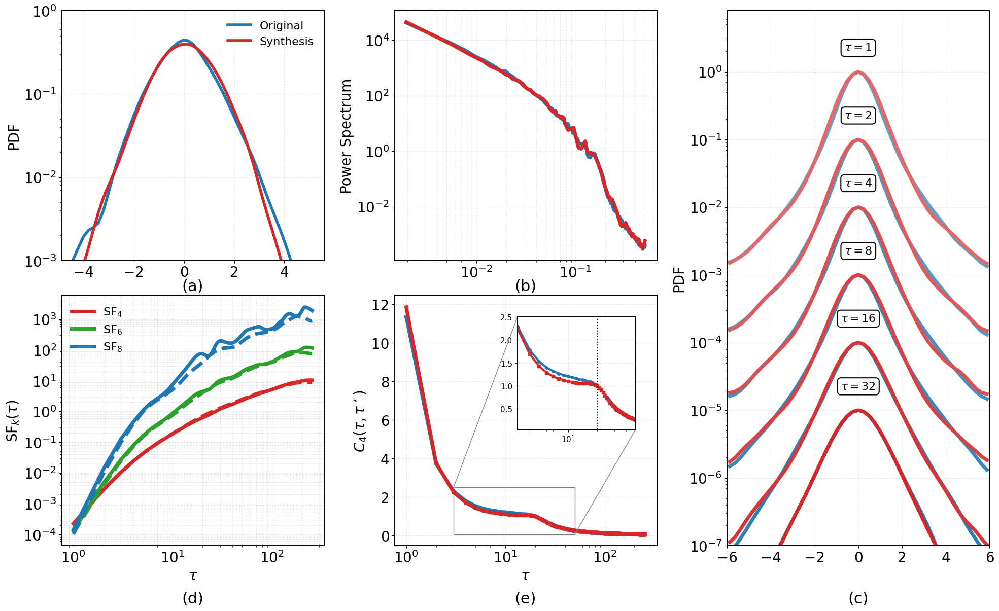

In [13]:
visual_comparison(x1, xt, c4_fixed_tau=20,a_ylim=(1e-3, 1),n_bins=50, smooth=True, smooth_sigma=1.5,
                      pdf_xlim=(-6, 6), epsilon=1e-8)